# TFRecord
Tensorflow提供了一种统一的格式来存储数据，这个格式就是TFRecord（键值对）

In [3]:
import tensorflow as tf
from tensorflow.examples.tutorials.mnist import input_data
import numpy as np

# 生成整数型的属性
def _int64_feature(value):
    return tf.train.Feature(int64_list=tf.train.Int64List(value=[value]))

# 生成字符串型的属性
def _bytes_feature(value):
    return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

mnist = input_data.read_data_sets('/opt/jupyter_files/MNIST',
                                  False,
                                 dtype=tf.uint8,
                                 one_hot=True)
images = mnist.train.images
# 训练数据所对应的正确答案，可以作为一个属性保存在TFRecoed中
labels = mnist.train.labels
# 训练数据的图像分辨率，可以作为Example中的一个属性
pixels = images.shape[1]
num_examples = mnist.train.num_examples

# 输出TFRecoed文件的地址
filename = '/opt/jupyter_files/output.tfrecords'
# 创建一个writer来写TFRecord文件
writer = tf.python_io.TFRecordWriter(filename)
for index in range(num_examples):
    # 将图像矩阵转化为一个字符串
    image_raw = images[index].tostring()
    # 将一个样例转化为Example Protocol Buffer，并将所有的信息写入这个数据结构
    example = tf.train.Example(features=tf.train.Features(feature={
        'pixels': _int64_feature(pixels),
        'label': _int64_feature(np.argmax(labels[index])),
        'image_raw': _bytes_feature(image_raw)
    }))
    # 将一个Example写入TFRecord文件
    writer.write(example.SerializeToString())
writer.close()

Extracting /opt/jupyter_files/MNIST/train-images-idx3-ubyte.gz
Extracting /opt/jupyter_files/MNIST/train-labels-idx1-ubyte.gz
Extracting /opt/jupyter_files/MNIST/t10k-images-idx3-ubyte.gz
Extracting /opt/jupyter_files/MNIST/t10k-labels-idx1-ubyte.gz


In [5]:
import tensorflow as tf

# 创建一个reader来读取TFRecord文件中的样例
reader = tf.TFRecordReader()
# 创建一个队列来维护输入文件列表
filename_queue = tf.train.string_input_producer(['/opt/jupyter_files/output.tfrecords'])

# 从文件中读出一个样例
# 也可以使用read_up_to函数一次性读取多个样例
_, serialized_example = reader.read(filename_queue)
# 解析读入的一个样例
# 如果需要解析多个样例，可以用parse_example函数
features = tf.parse_single_example(serialized_example,
                                  features={
                                      # Tensorflow提供两种不同的属性解析方法
                                      # 一种是tf.FixedLenFeature，结果为一个Tensor
                                      # 另一种是tf.VarLenFeature，解析为SparseTensor
                                      # 用于处理稀疏数据。
                                      # 下述解析数据的格式需要和上面程序格式一致
                                      'image_raw': tf.FixedLenFeature([], tf.string),
                                      'pixels': tf.FixedLenFeature([], tf.int64),
                                      'label': tf.FixedLenFeature([], tf.int64)
                                  })

# tf.decode_raw可以将字符串解析成图像对应的像素数组
image = tf.decode_raw(features['image_raw'], tf.uint8)
label = tf.cast(features['label'], tf.int32)
pixels = tf.cast(features['pixels'], tf.int32)

sess = tf.Session()
# 启动多线程处理输入数据
coord = tf.train.Coordinator()
threads = tf.train.start_queue_runners(sess=sess, coord=coord)

# 每次运行可以读取TFRecord文件中的一个样例
# 当所有样例都读完之后，在此样例中程序会再重头读取
for i in range(10):
    print(sess.run([image, label, pixels]))

[array([  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  

# 图像处理
## 图像编码处理
Tensorflow提供了对jpeg和png格式图像的编码/解码函数

[[[ 58  47  19]
  [ 59  48  20]
  [ 56  47  18]
  ..., 
  [ 53  42  14]
  [ 62  51  21]
  [ 61  50  20]]

 [[ 59  48  20]
  [ 59  48  20]
  [ 56  47  18]
  ..., 
  [ 60  49  21]
  [ 63  52  22]
  [ 61  50  20]]

 [[ 57  46  16]
  [ 56  45  15]
  [ 56  47  16]
  ..., 
  [ 54  45  16]
  [ 50  41  10]
  [ 50  41  10]]

 ..., 
 [[ 99  98  44]
  [ 98  97  43]
  [100  97  42]
  ..., 
  [102  97  42]
  [ 99  96  43]
  [ 96  95  41]]

 [[ 97  94  43]
  [ 97  94  41]
  [ 99  96  41]
  ..., 
  [102  97  42]
  [ 99  96  43]
  [ 98  95  44]]

 [[ 97  94  43]
  [ 95  92  39]
  [ 95  92  37]
  ..., 
  [ 98  93  38]
  [ 95  92  41]
  [ 97  94  43]]]


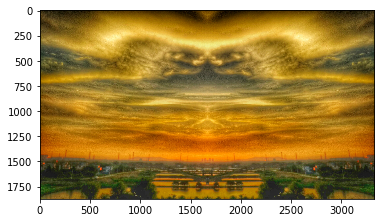

In [1]:
import matplotlib.pyplot as plt
import tensorflow as tf

# 读取图像的原始数据
image_raw_data = tf.gfile.FastGFile('/opt/jupyter_files/picture/pic.jpeg', 'rb').read()

with tf.Session() as sess:
    # 对图像进行jpeg的格式解码从而得到图像对应的三维矩阵
    img_data = tf.image.decode_jpeg(image_raw_data)
    print(img_data.eval())
    
    # 使用pyplot工具可视化得到图像
    plt.imshow(img_data.eval())
    plt.show()
    
    # 将表示一张图像的三维矩阵重新安装jpeg格式编码并存入文件中
    # 打开这张图像，可得到和原始图像一样的图像
    encoded_image = tf.image.encode_jpeg(img_data)
    with tf.gfile.GFile('/opt/jupyter_files/output', 'wb') as f:
        f.write(encoded_image.eval())

## 图像大小调整
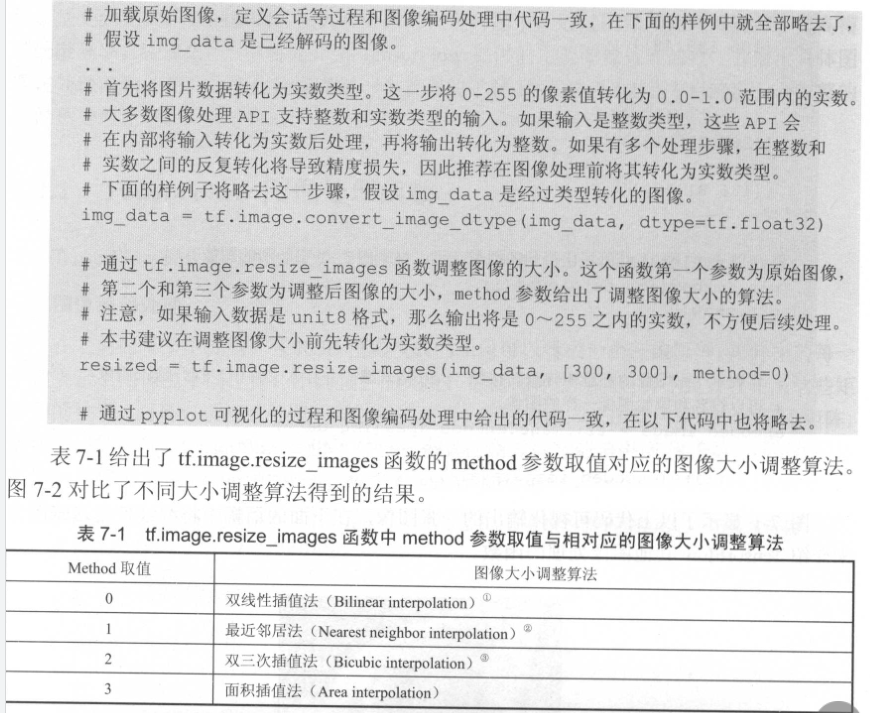

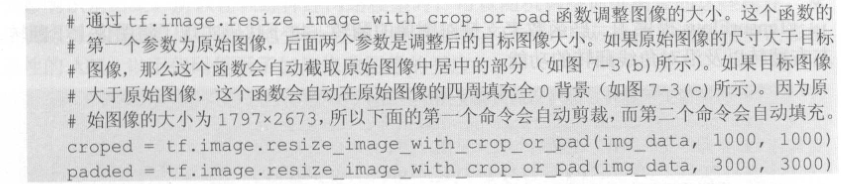

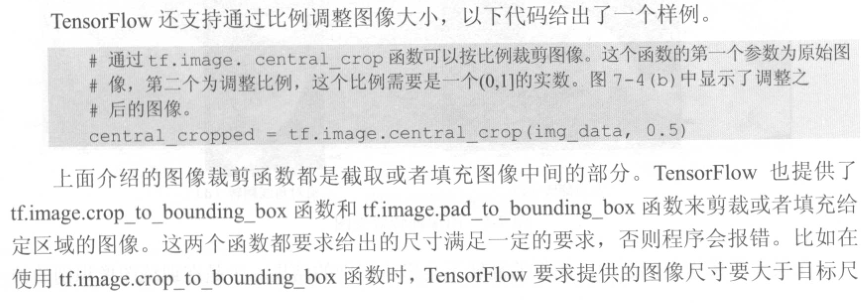

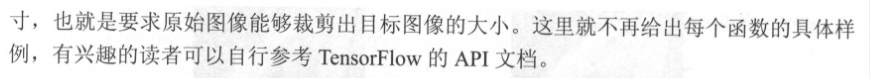

## 图像翻转
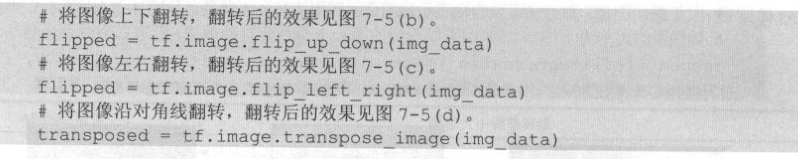

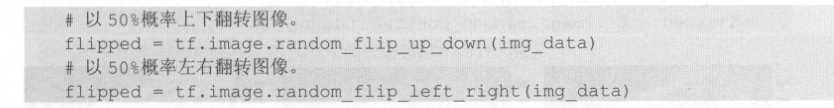

# 图像色彩调整
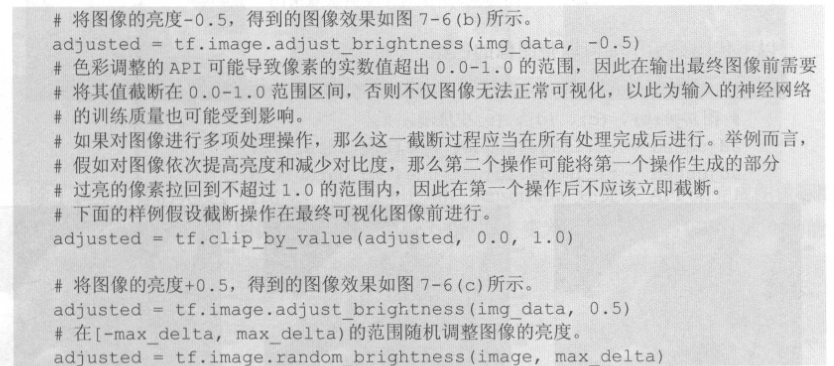

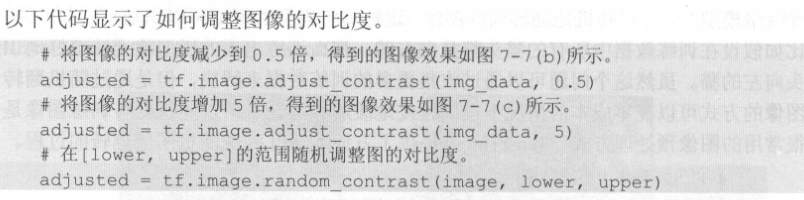

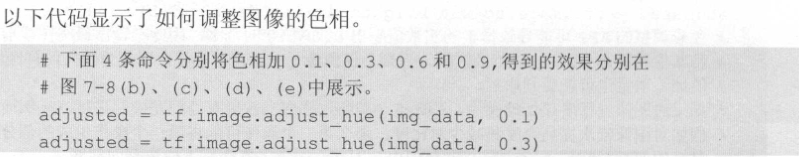

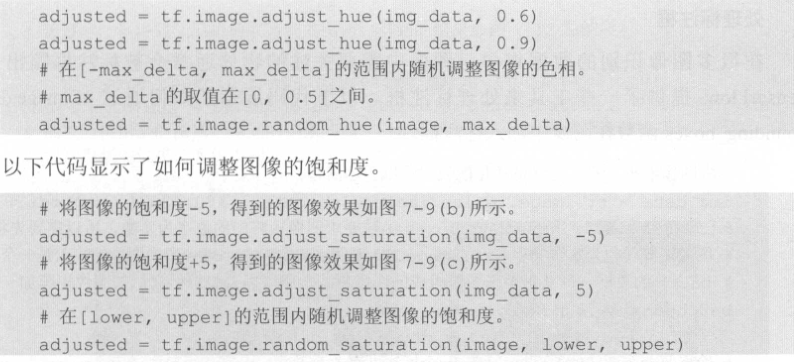

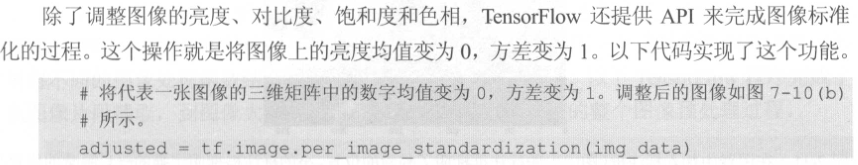

## 处理标注框
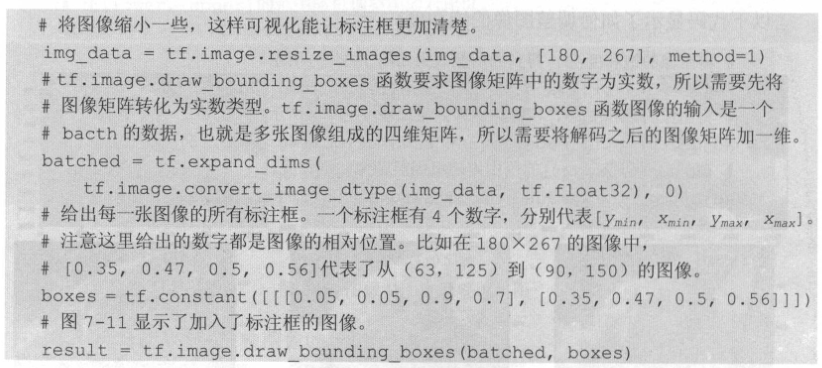

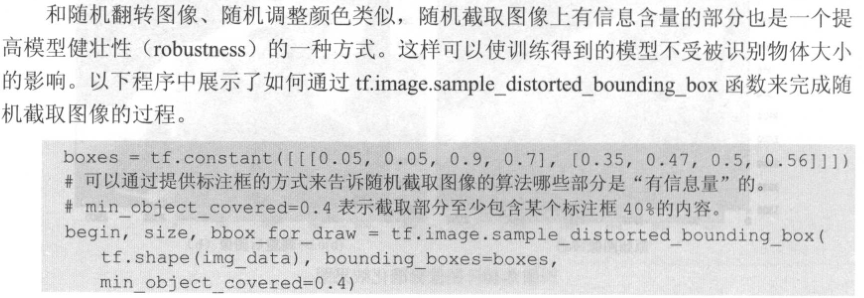

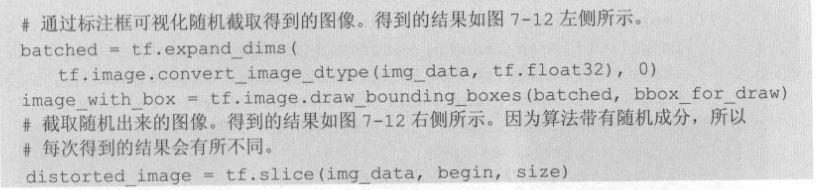

# 图像预处理完整样例

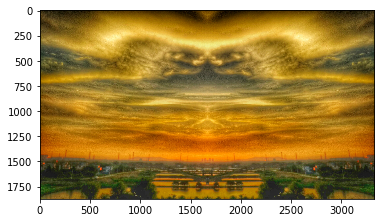

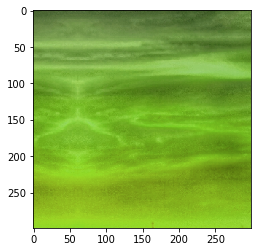

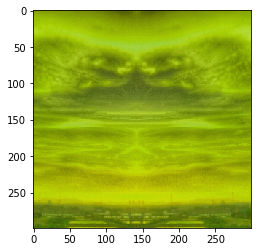

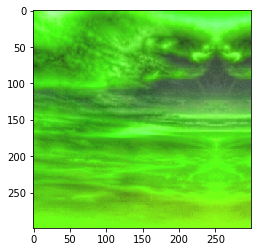

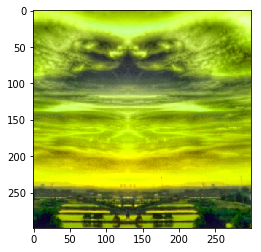

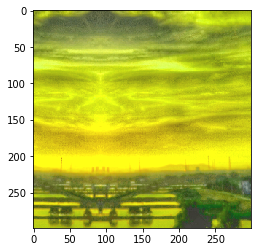

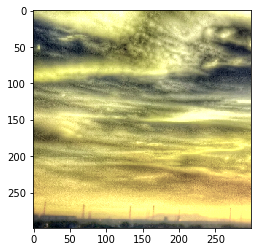

In [9]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# 给定一张图像，随机调整图像的色彩
# 因为调整亮度、对比度、饱和度和色相的顺序会影响最后得到的结果，所有可定义多种顺序
# 顺序可以随机选择，这样能进一步降低无关因素对模型的影响
def distort_color(image, color_ordering=0):
    if color_ordering == 0:
        # 亮度
        image = tf.image.random_brightness(image, max_delta=32. / 255.)
        # 饱和度
        image = tf.image.random_saturation(image, lower=0.5, upper=1.5)
        # 色相
        image = tf.image.random_hue(image, max_delta=0.2)
        # 对比度
        image = tf.image.random_contrast(image, lower=0.5, upper=1.5)
    elif color_ordering == 1:
        image = tf.image.random_saturation(image, lower=0.5, upper=1.5)
        image = tf.image.random_brightness(image, max_delta=32. / 255.)
        image = tf.image.random_contrast(image, lower=0.5, upper=1.5)
        image = tf.image.random_hue(image, max_delta=0.2)
    # elif ... 这里不再一一列出
    
    return tf.clip_by_value(image, 0.0, 1.0)

# 给定一张解码后的图像、目标图像的尺寸以及图像上的标注框，即预处理
# 这个函数的输入图像是图像识别问题中原始的训练图像，而输出的则是神经网络模型的输入层
def preprocess_for_train(image, height, width, bbox):
    # 如果没有提供标注框，则认为整个图像就是需要关注的部分
    if bbox is None:
        bbox = tf.constant([0.0, 0.0, 1.0, 1.0],
                          dtype=tf.float32,
                          shape=[1, 1, 4])
    
    # 转换图像张量的类型
    if image.dtype != tf.float32:
        image = tf.image.convert_image_dtype(image, dtype=tf.float32)
        
    # 随机截取图像，减小需要关注的物体大小对图像识别算法的影响
    bbox_begin, bbox_size, _ = tf.image.sample_distorted_bounding_box(tf.shape(image),
                                                                     bounding_boxes=bbox,
                                                                     min_object_covered=0.4)
    distorted_image = tf.slice(image, bbox_begin, bbox_size)
    
    # 将随机截取的图像（随机）调整为神经网络输入层的大小
    distorted_image = tf.image.resize_images(distorted_image,
                                            [height, width],
                                            method=np.random.randint(4))
    
    # 随机左右翻转图像
    distorted_image = tf.image.random_flip_left_right(distorted_image)
    
    # 使用一种随机的顺序调整图像色彩
    distorted_image = distort_color(distorted_image, np.random.randint(2))
    
    return distorted_image

image_raw_data = tf.gfile.FastGFile('/opt/jupyter_files/picture/pic.jpeg', 'rb').read()
with tf.Session() as sess:
    img_data = tf.image.decode_jpeg(image_raw_data)
    plt.imshow(img_data.eval())
    plt.show()
    
    boxes = tf.constant([[[0.05, 0.05, 0.9, 0.7],
                         [0.35, 0.47, 0.5, 0.56]]])
    # 运行6次获得6种不同的图像
    for i in range(6):
        # 将图像的尺寸调整为299×299
        result = preprocess_for_train(img_data, 299, 299, boxes)
        plt.imshow(result.eval())
        plt.show()

# 输入数据处理框架

In [10]:
# 上一章代码，无任何更改

# 定义了前向传播的过程以及神经网络的参数。实际可单独放入一个文件，如mnist_inference.py
# -*- coding: utf-8 -*-
import tensorflow as tf

# 定义神经网络结构相关的参数
INPUT_NODE = 784
OUTPUT_NODE = 10

IMAGE_SIZE = 28
NUM_CHANNELS = 1
NUM_LABELS = 10

#第一层卷积层的尺寸和深度
CONV1_DEEP = 32
CONV1_SIZE = 5
#第二层卷积层的尺寸和深度
CONV2_DEEP = 64
CONV2_SIZE = 5
# 全连接层的节点个数
FC_SIZE = 512

# 通过tf.get_variable函数来获取变量，在训练神经网络时会创建这些变量
# 在测试时会通过保存的模型加载这些变量的取值
# 因为可以在变量加载时将滑动平均变量重命名
# 所以可以直接通过相同的名字在训练时使用变量自身，而在测试时使用变量的滑动平均值
# 在这个函数中也会将变量的正则化损失加入损失集合
def get_weight_variable(shape, regularizer):
    weights = tf.get_variable('weights',
                              shape,
                             initializer=tf.truncated_normal_initializer(stddev=0.1))
    
    # 当给出了正则化生成函数时，将当前变量的正则化损失加入名字为losses的集合
    # 在这里使用了add_to_collection函数将一个张量加入一个集合
    # 而这个集合的名称为losses，这是自定义集合，不在Tensorflow自动管理的集合列表中
    if regularizer != None:
        tf.add_to_collection('losses', regularizer(weights))
        
    return weights

# 定义卷积神经网络的前向传播过程
# 这里添加了新参数train，用于区分训练过程和测试过程
# 训练中将用到dropout方法，可进一步提升模型可靠性并防止过拟合
def inference(input_tensor, train, regularizer):
    # 声明第一层卷积层的变量并实现前向传播过程
    # 通过使用不同的命名空间来隔离不同层的变量，可让每一层中的变量命名只需要考虑当前层
    # 和标准LeNet-5模型不太一样，这里定义的卷积层输入为28×28×1的原始MNIST图像像素
    # 因为卷积层使用了全0填充，所以输出为28×28×32的矩阵
    with tf.variable_scope('layer1-conv1'):
        conv1_weights = tf.get_variable('weight',
                                       [CONV1_SIZE, CONV1_SIZE, NUM_CHANNELS, CONV1_DEEP],
                                       initializer=tf.truncated_normal_initializer(stddev=0.1))
        conv1_biases = tf.get_variable('bias',
                                      [CONV1_DEEP],
                                      initializer=tf.constant_initializer(0.0))
        # 使用边长为5，深度为32的过滤器，过滤器移动的步长为1，且使用全0填充
        conv1 = tf.nn.conv2d(input_tensor,
                            conv1_weights,
                            strides=[1, 1, 1, 1],
                            padding='SAME')
        relu1 = tf.nn.relu(tf.nn.bias_add(conv1, conv1_biases))
        
    # 实现第二层池化层的前向传播过程
    # 这里选用最大池化层，过滤器边长为2，使用全0填充且移动步长为2
    # 其输入为28×28×32，输出为14×14×32的矩阵
    with tf.name_scope('layer2-pool1'):
        pool1 = tf.nn.max_pool(relu1,
                              ksize = [1, 2, 2, 1],
                              strides=[1, 2, 2, 1],
                              padding='SAME')
        
    # 声明第三层卷积层的变量并实现前向传播过程
    # 输入为14×14×32的矩阵，输出为14×14×64的矩阵
    with tf.variable_scope('layer3-conv2'):
        conv2_weights = tf.get_variable('weight',
                                       [CONV2_SIZE, CONV2_SIZE, CONV1_DEEP, CONV2_DEEP],
                                       initializer=tf.truncated_normal_initializer(stddev=0.1))
        conv2_biases = tf.get_variable('bias',
                                      [CONV2_DEEP],
                                      initializer=tf.constant_initializer(0.0))
        # 使用边长为5，深度为64的过滤器，过滤器移动的步长为1，且使用全0填充
        conv2 = tf.nn.conv2d(pool1,
                            conv2_weights,
                            strides=[1, 1, 1, 1],
                            padding='SAME')
        relu2 = tf.nn.relu(tf.nn.bias_add(conv2, conv2_biases))
        
    # 实现第四层池化层的前向传播过程
    # 其输入为14×14×64，输出为7×7×64的矩阵
    with tf.name_scope('layer4-pool2'):
        pool2 = tf.nn.max_pool(relu2,
                              ksize = [1, 2, 2, 1],
                              strides=[1, 2, 2, 1],
                              padding='SAME')
    
    # 将第四层池化层的输入转化为第五层全连接层的输入格式
    # 第四层的输入为7×7×64的矩阵，然后第五层全连接层需要输入格式为向量
    # 所以需要将该矩阵拉直成一个向量。get_shape函数可得到第四层输出矩阵的维度
    # 注意每一层神经网络的输入输出都为一个batch的矩阵
    # 所以这里得到的维度也包含一个batch中数据的个数
    pool_shape = pool2.get_shape().as_list()
    # 计算将矩阵拉直成向量之后的长度，这个长度就是矩阵长宽及深度的乘积
    # 注意pool_shape[0]为一个batch中数据的个数
    nodes = pool_shape[1] * pool_shape[2] * pool_shape[3]
    # 将第四层的输出变成一个batch向量
    reshaped = tf.reshape(pool2, [pool_shape[0], nodes])
    
    # 声明第五层全连接层的变量并实现前向传播过程
    # 这层的输入是拉直后的一组长度为3136的向量，输出是一组长度为512的向量
    # 这层和上节基本一致，唯一的区别是引入了dropout概念
    # dropout在训练时会随机将部分节点的输出改为0，避免过拟合问题
    # dropout一般只在全连接层而不是卷积层或池化层使用
    with tf.variable_scope('layer5-fc1'):
        fc1_weights = tf.get_variable('weight',
                                    [nodes, FC_SIZE],
                                    initializer=tf.truncated_normal_initializer(stddev=0.1))
        # 只有全连接层的权重需要加入正则化
        if regularizer != None:
            tf.add_to_collection('losses', regularizer(fc1_weights))
        fc1_biases = tf.get_variable('bias',
                                    [FC_SIZE],
                                    initializer=tf.constant_initializer(0.1))
        
        fc1 = tf.nn.relu(tf.matmul(reshaped, fc1_weights) + fc1_biases)
        if train:
            fc1 = tf.nn.dropout(fc1, 0.5)
    
    # 声明第六层全连接层的变量并实现前向传播过程
    # 这层的输入是一组长度为512的向量，输出是一组长度为10的向量
    # 这层的输出通过softmax之后就得到了最后的分类结果
    with tf.variable_scope('layer6-fc2'):
        fc2_weights = tf.get_variable('weight',
                                    [FC_SIZE, NUM_LABELS],
                                    initializer=tf.truncated_normal_initializer(stddev=0.1))
        if regularizer != None:
            tf.add_to_collection('losses', regularizer(fc2_weights))
        fc2_biases = tf.get_variable('bias',
                                    [NUM_LABELS],
                                    initializer=tf.constant_initializer(0.1))
        logit = tf.matmul(fc1, fc2_weights) + fc2_biases
    
    return logit

In [14]:
import tensorflow as tf

# 创建文件列表，并通过文件列表创建输入文件队列
# 在调用输入数据处理流程前，需要统一所有原始数据的格式并将它们存储到TFRecord文件中
# 下面给出的文件列表应该包含所有提供训练数据的TFRecord文件
files = tf.train.match_filenames_once('/opt/jupyter_files/output.tfrecords')  # 数据集未知
filename_queue = tf.train.string_input_producer(files, shuffle=False)

# 解析TFRecord文件里的数据
# image存储的是图像的原始数据，label为样例对应的标签，height,width,channels给出了图片维度
reader = tf.TFRecordReader()
_, serializer_example = reader.read(filename_queue)
features = tf.parse_single_example(serializer_example,
                                  features={
                                      'image': tf.FixedLenFeature([], tf.string),
                                      'label': tf.FixedLenFeature([], tf.int64),
                                      'height': tf.FixedLenFeature([], tf.int64),
                                      'width': tf.FixedLenFeature([], tf.int64),
                                      'channels': tf.FixedLenFeature([], tf.int64)
                                  })
image, label = features['image'], features['label']
height, width = features['height'], features['width']
channels = features['channels']

# 从原始图像数据解析出像素矩阵，并根据图形尺寸还原图像
decoded_image = tf.decode_raw(image, tf.uint8)
decoded_image.set_shape([height, width, channels])
# 定义神经网络输入层图片的大小
image_size = 299
# preprocess_for_train为上节代码
distorted_image = preprocess_for_train(decoded_image, image_size, image_size, None)

# 将处理后的图像和标签数据通过tf.train.shuffle_batch整理成神经网络训练时需要的batch
min_after_dequeue = 10000
batch_size = 100
capacity = min_after_dequeue + 3 * batch_size
image_batch, label_batch = tf.train.shuffle_batch([distorted_image, label],
                                                 batch_size=batch_size,
                                                 capacity=capacity,
                                                 min_after_dequeue=min_after_dequeue)

# 定义神经网络的结构以及优化过程
# image_batch可作为输入提供给神经网络的输入层
# label_batch提供了输入batch中样例的正确答案
learning_rate = 0.01
logit = inference(image_batch)
train_step = tf.train.GradientDescentOptimizer(learning_rate).minimize(loss)

# 声明会话并运行神经网络的优化过程
with tf.Session() as sess:
    # 神经网络准备工作，包括变量初始化，线程启动
    sess.run(tf.global_variables_initializer(),
            tf.local_variables_initializer())
    coord = tf.train.Coordinator()
    threads = tf.train.start_queue_runners(sess=sess, coord=coord)
    
    # 神经网络训练过程
    TRAINING_ROUNDS = 5000
    for i in range(TRAINING_ROUNDS):
        sess.run(train_step)
        
    # 停止所有线程
    coord.request_stop()
    coord.join(threads)

TypeError: int() argument must be a string, a bytes-like object or a number, not 'Tensor'

## 简化版

In [21]:
import tensorflow as tf

# 创建文件列表，并通过文件列表创建输入文件队列
# 在调用输入数据处理流程前，需要统一所有原始数据的格式并将它们存储到TFRecord文件中
# 下面给出的文件列表应该包含所有提供训练数据的TFRecord文件
files = tf.train.match_filenames_once('/opt/jupyter_files/output.tfrecords')
filename_queue = tf.train.string_input_producer(files, shuffle=False)

# 解析TFRecord文件里的数据
reader = tf.TFRecordReader()
_, serialized_example = reader.read(filename_queue)

# 解析读取的样例。
features = tf.parse_single_example(
    serialized_example,
    features={
        'image_raw': tf.FixedLenFeature([], tf.string),
        'pixels': tf.FixedLenFeature([], tf.int64),
        'label': tf.FixedLenFeature([], tf.int64)
    })

decoded_images = tf.decode_raw(features['image_raw'], tf.uint8)
retyped_images = tf.cast(decoded_images, tf.float32)
images = tf.reshape(retyped_images, [784])

labels = tf.cast(features['label'],tf.int32)
pixels = tf.cast(features['pixels'],tf.int32)


# 将文件以100个为一组打包
min_after_dequeue = 10000
batch_size = 100
capacity = min_after_dequeue + 3 * batch_size

image_batch, label_batch = tf.train.shuffle_batch([images, labels], 
                                                  batch_size=batch_size, 
                                                  capacity=capacity, 
                                                  min_after_dequeue=min_after_dequeue)

# 训练模型
def inference(input_tensor, weights1, biases1, weights2, biases2):
    layer1 = tf.nn.relu(tf.matmul(input_tensor, weights1) + biases1)
    return tf.matmul(layer1, weights2) + biases2

# 模型相关的参数
INPUT_NODE = 784
OUTPUT_NODE = 10
LAYER1_NODE = 500
REGULARAZTION_RATE = 0.0001   
TRAINING_STEPS = 5000        

weights1 = tf.Variable(tf.truncated_normal([INPUT_NODE, LAYER1_NODE], stddev=0.1))
biases1 = tf.Variable(tf.constant(0.1, shape=[LAYER1_NODE]))

weights2 = tf.Variable(tf.truncated_normal([LAYER1_NODE, OUTPUT_NODE], stddev=0.1))
biases2 = tf.Variable(tf.constant(0.1, shape=[OUTPUT_NODE]))

y = inference(image_batch, weights1, biases1, weights2, biases2)
    
# 计算交叉熵及其平均值
cross_entropy = tf.nn.sparse_softmax_cross_entropy_with_logits(logits=y, labels=label_batch)
cross_entropy_mean = tf.reduce_mean(cross_entropy)
    
# 损失函数的计算
regularizer = tf.contrib.layers.l2_regularizer(REGULARAZTION_RATE)
regularaztion = regularizer(weights1) + regularizer(weights2)
loss = cross_entropy_mean + regularaztion

# 优化损失函数
train_step = tf.train.GradientDescentOptimizer(0.01).minimize(loss)
    
# 初始化会话，并开始训练过程。
with tf.Session() as sess:
    sess.run((tf.global_variables_initializer(),
              tf.local_variables_initializer()))
    
    coord = tf.train.Coordinator()
    threads = tf.train.start_queue_runners(sess=sess, coord=coord)
    
    # 循环的训练神经网络。
    for i in range(TRAINING_STEPS):
        if i % 1000 == 0:
            print("After %d training step(s), loss is %g " % (i, sess.run(loss)))
                  
        sess.run(train_step) 
        
    coord.request_stop()
    coord.join(threads)

After 0 training step(s), loss is 363.647 
After 1000 training step(s), loss is 2.88349 
After 2000 training step(s), loss is 1.78844 
After 3000 training step(s), loss is 1.43843 
After 4000 training step(s), loss is 1.98484 


# 数据集
利用数据集读取数据有三个基本步骤：

1、定义数据集的构造方法

2、定义遍历器

3、从遍历器读取数据张量，作为计算图其他部分的输入

In [23]:
import tensorflow as tf

# 从一个数组创建数据集
input_data = [1, 2, 3, 5, 8]
dataset = tf.data.Dataset.from_tensor_slices(input_data)

# 定义一个迭代器用于遍历数据集
# 因为上面定义的数据集没有用placeholder作为输入参数
# 所以这里可以使用最简单的one_shot_iterator
iterator = dataset.make_one_shot_iterator()

# get_next()返回代表一个输入数据的张量，类似于对列的dequeue()
x = iterator.get_next()
y = x * x

with tf.Session() as sess:
    for i in range(len(input_data)):
        print(sess.run(y))

1
4
9
25
64


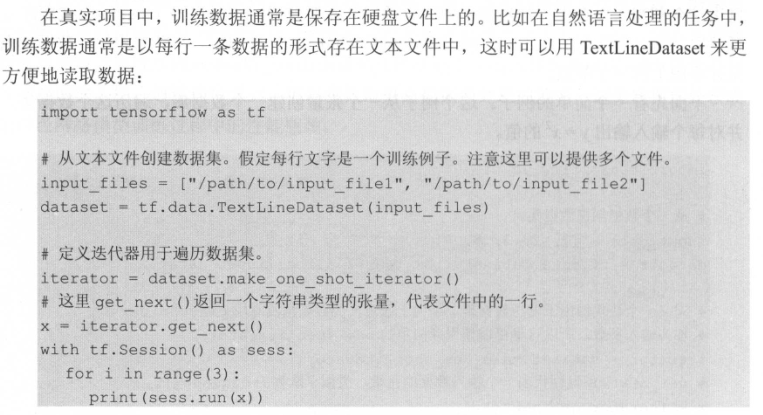

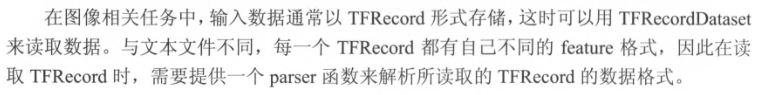

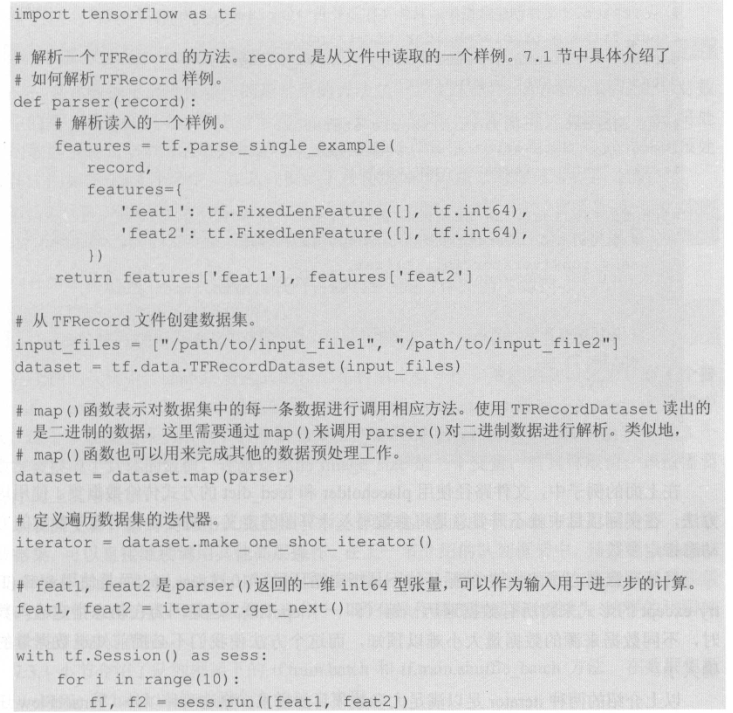

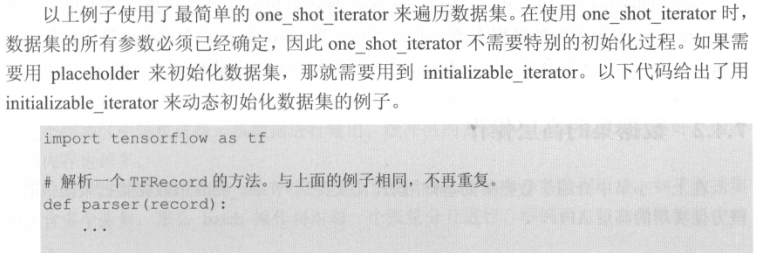

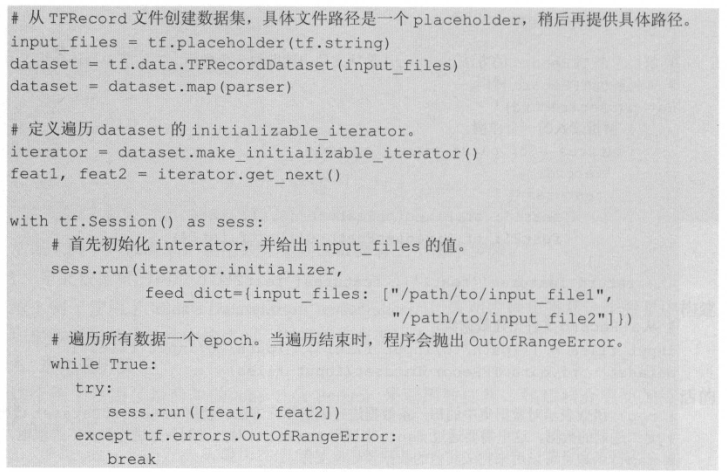

## 数据集的高层操作
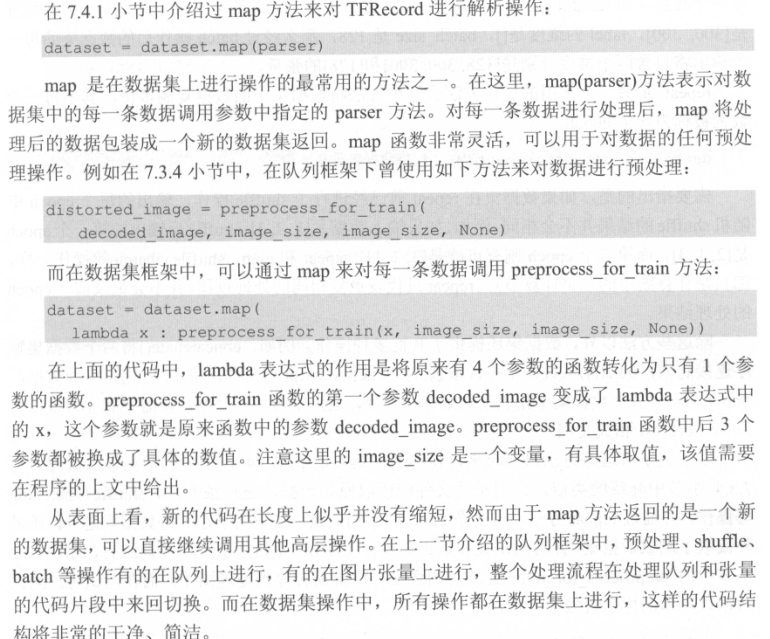

---

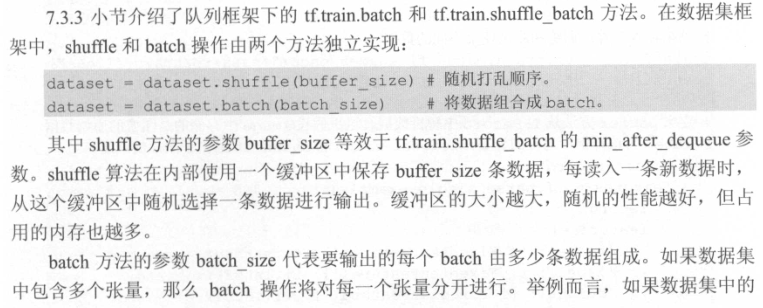

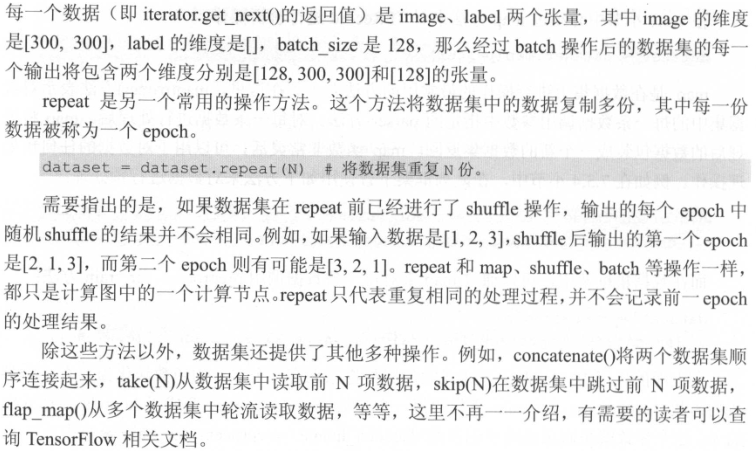

## 综合样例

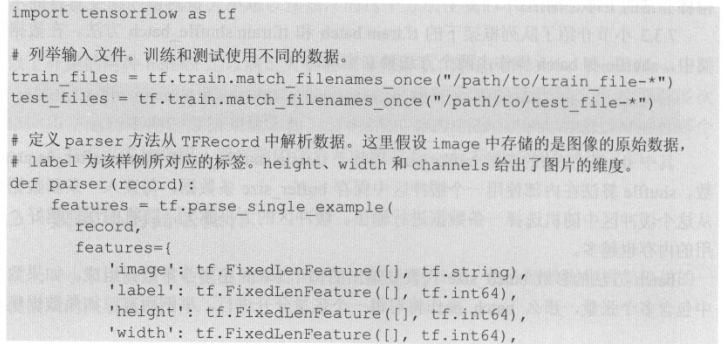

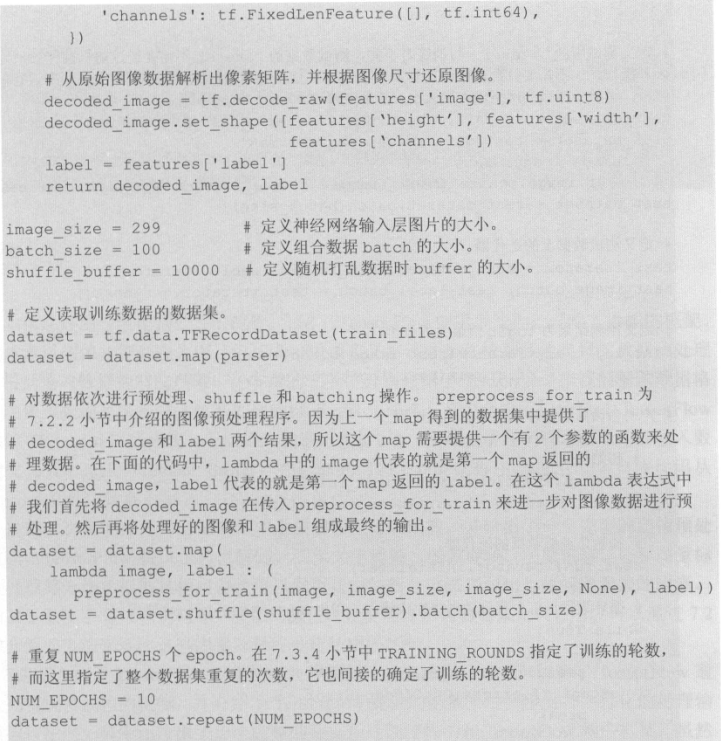

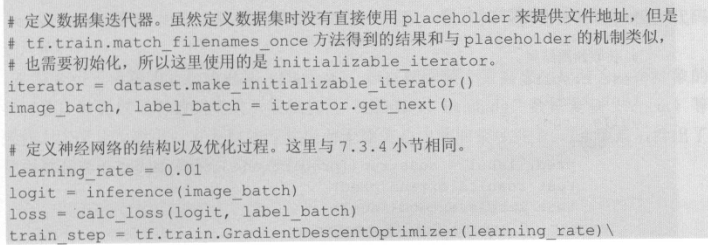

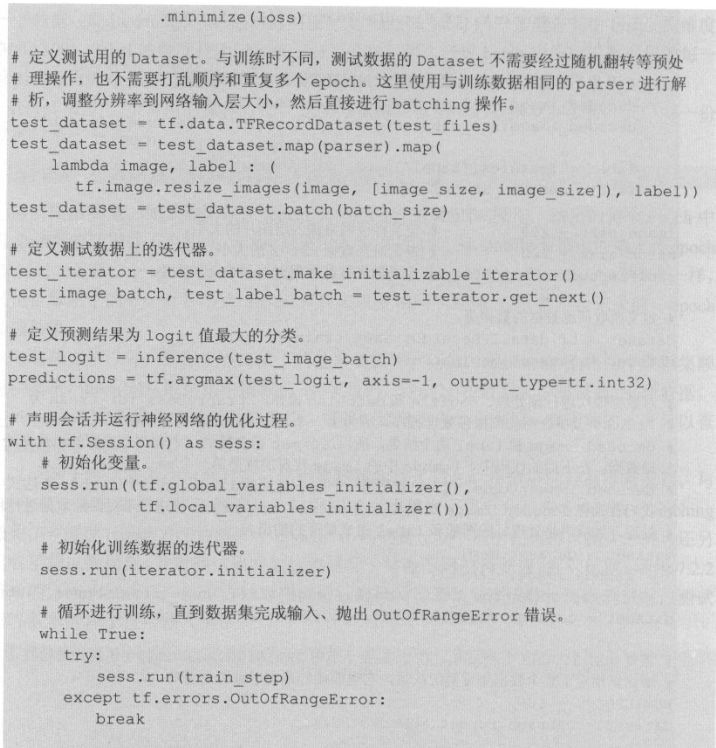

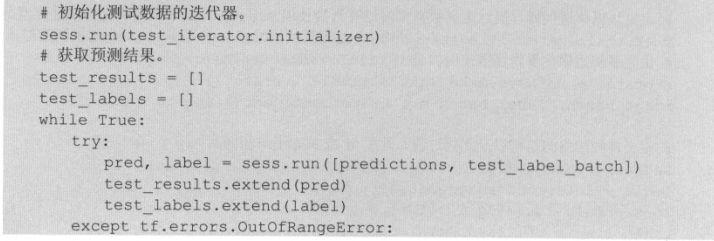

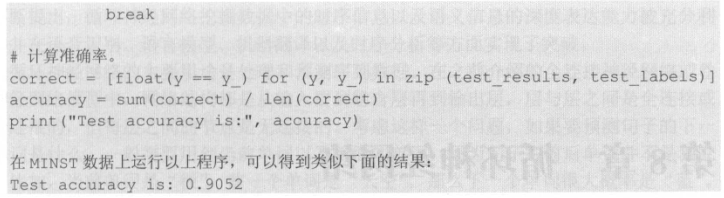